In [298]:
#IIT2018150

import numpy as np
import matplotlib.pyplot as plt
import os 
import cv2
import random


# Note: 
# 1.Set path of dataset accordingly, here it is set according to jupyter notebook
# code execution may take 3-4 minutes. 

# Set path of dataset

In [299]:

path= '/home/elitesf/Downloads/face_dataset/actual'

# 'actual' in face_dataset folder contains dataset provided by Sir.
# 'imposter' in face_dataset folder contains imposters taken randomly from internet

# Split into test and training dataset

In [300]:

width= 64
height= 64
X_train= []
X_test= []
X_train_label= []
X_test_label= []

for folder in os.listdir(path):
  if folder!='README':
    
    folder_path= os.path.join(path,folder)
    total_size = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
    train_size = int(0.6*total_size) 
    train_idx = random.sample(range(0, total_size), train_size)
    idx= 0
    for img_label in os.listdir(folder_path):

        img_path= os.path.join(folder_path,img_label)
        if idx in train_idx:
            X_train.append(img_path)
            X_train_label.append(folder)
        else:
            X_test.append(img_path)
            X_test_label.append(folder)
        idx= idx+1
        
print('Training set images count: ',len(X_train))
print('Testing set images count: ',len(X_test))
      

Training set images count:  240
Testing set images count:  160


# Read image, Resize, Store All in matrix

In [301]:
#resize , convert N*N image to N2 * 1 vector and insert that as column into train_matrix with dim= (N*N,train_size)

def images_in_matrixform(X):
    
    row= height*width    #(i.e. N*N)
    col= len(X)
    i=0
    matrix= np.zeros((row,col))
    for img_path in X:

        img= cv2.imread(img_path,0)
        img= cv2.resize(img,(height,width))
        img= img.flatten()

        for j in range(len(img)):
            matrix[j][i]= int(img[j])
        i+= 1
        
    return matrix

In [302]:
train_matrix= images_in_matrixform(X_train)
print('Training matrix dimensions: ',train_matrix.shape,'\n')
print('Matrix with each column as training image\n',train_matrix)

Training matrix dimensions:  (4096, 240) 

Matrix with each column as training image
 [[ 53.  51.  48. ...  48. 121.  48.]
 [ 50.  49.  48. ...  51. 121.  50.]
 [ 53.  50.  47. ...  49. 121.  47.]
 ...
 [ 31.  39.  46. ...  32. 140.  43.]
 [ 33.  40.  41. ...  38. 130.  53.]
 [ 32.  44.  37. ...  38. 114.  41.]]


# Normalize matrix function

In [303]:
def normalize_matrix(matrix):

    #M= len(X)
    mean_img= np.zeros((height*width,1))
    mean_img= np.mean(matrix,axis=1)
    print(len(mean_img))
    print('Mean img vector:\n',mean_img,'\n')

    for j in range(len(matrix[0])):
        matrix[:,j]= matrix[:,j]- mean_img
    return matrix

In [304]:
train_matrix= normalize_matrix(train_matrix)
print('Normalised train matrix dimensions: ',train_matrix.shape,'\n')
print('Normalised train matrix:\n',train_matrix,'\n')

4096
Mean img vector:
 [85.70833333 85.97083333 86.02083333 ... 74.5        74.46666667
 73.79583333] 

Normalised train matrix dimensions:  (4096, 240) 

Normalised train matrix:
 [[-32.70833333 -34.70833333 -37.70833333 ... -37.70833333  35.29166667
  -37.70833333]
 [-35.97083333 -36.97083333 -37.97083333 ... -34.97083333  35.02916667
  -35.97083333]
 [-33.02083333 -36.02083333 -39.02083333 ... -37.02083333  34.97916667
  -39.02083333]
 ...
 [-43.5        -35.5        -28.5        ... -42.5         65.5
  -31.5       ]
 [-41.46666667 -34.46666667 -33.46666667 ... -36.46666667  55.53333333
  -21.46666667]
 [-41.79583333 -29.79583333 -36.79583333 ... -35.79583333  40.20416667
  -32.79583333]] 



# covariance_matrix

In [305]:
M= len(X_train)
cov_matrix= np.dot(train_matrix.T,train_matrix)
cov_matrix= np.divide(cov_matrix,M) 
print('dimensions of coveriance matrix:',cov_matrix.shape)
print('cov matrix- \n',cov_matrix)

dimensions of coveriance matrix: (240, 240)
cov matrix- 
 [[29591.68590357 21997.44861191 17480.48894177 ...  9660.86967093
  -1528.07918323  6398.64956677]
 [21997.44861191 33089.92382024 24306.4891501  ... 10622.4532126
   2689.95019177  7018.75810843]
 [17480.48894177 24306.4891501  29912.74197996 ... 11024.14770913
   4504.77385496  8409.2859383 ]
 ...
 [ 9660.86967093 10622.4532126  11024.14770913 ... 29480.6534383
  11050.1712508  18508.4750008 ]
 [-1528.07918323  2689.95019177  4504.77385496 ... 11050.1712508
  28836.5265633   9144.55114663]
 [ 6398.64956677  7018.75810843  8409.2859383  ... 18508.4750008
   9144.55114663 25215.83822996]]


# eigenvalues And eigenvectors

In [306]:
eigen_val, eigen_vec = np.linalg.eig(cov_matrix)
print(eigen_val.shape)
print(eigen_vec.shape)

(240,)
(240, 240)


# eigenfaces

In [307]:
def topK_eigenvectors(eigen_vec,K):
    K_eigen_vec= eigen_vec[:,:K]
    #print(K_eigen_vec.shape)
    return K_eigen_vec

def find_eigenfaces(train_matrix,eigen_vec):
    eigen_face= np.dot(eigen_vec.T,train_matrix.T)
    return eigen_face

In [308]:
def plot_faces(eigen_face):
    
    print("\t\t\t Top 6 eigen faces")
    fig = plt.figure(figsize=(12, 12))
    
    for i in range(6):
        
        fig.add_subplot(1,6,1+i)
        plt.title("eigen_face no "+str(i+1))
        face =np.reshape(eigen_face[i], (width, height))
        plt.imshow(face)
    
    plt.show()    

			 Top 6 eigen faces


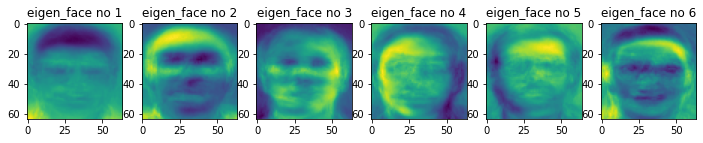

(20, 4096)


In [309]:
K= 20
K_eigen_vec= topK_eigenvectors(eigen_vec,K)
eigen_faces= find_eigenfaces(train_matrix,K_eigen_vec)
plot_faces(eigen_faces)
print(eigen_faces.shape)

#some eigen faces

# Testing part from here

In [310]:
test_matrix= images_in_matrixform(X_test)
print('Testing matrix dimensions: ',test_matrix.shape,'\n')
print('Matrix with each column as testing image\n',test_matrix)

Testing matrix dimensions:  (4096, 160) 

Matrix with each column as testing image
 [[ 43.  48.  51. ... 121. 121.  51.]
 [ 46.  50.  52. ... 121. 122.  50.]
 [ 48.  47.  49. ... 122. 122.  54.]
 ...
 [ 42.  33.  31. ...  99. 139.  37.]
 [ 40.  32.  33. ...  97. 142.  33.]
 [ 40.  32.  32. ... 100. 146.  43.]]


In [311]:
test_matrix= normalize_matrix(test_matrix)
print('Normalised test matrix dimensions: ',test_matrix.shape,'\n')
print('Normalised test matrix:\n',test_matrix,'\n')
# y= test_matrix.T
# print(y.shape[0])

4096
Mean img vector:
 [85.275   85.3875  85.41875 ... 76.8625  77.00625 75.975  ] 

Normalised test matrix dimensions:  (4096, 160) 

Normalised test matrix:
 [[-42.275   -37.275   -34.275   ...  35.725    35.725   -34.275  ]
 [-39.3875  -35.3875  -33.3875  ...  35.6125   36.6125  -35.3875 ]
 [-37.41875 -38.41875 -36.41875 ...  36.58125  36.58125 -31.41875]
 ...
 [-34.8625  -43.8625  -45.8625  ...  22.1375   62.1375  -39.8625 ]
 [-37.00625 -45.00625 -44.00625 ...  19.99375  64.99375 -44.00625]
 [-35.975   -43.975   -43.975   ...  24.025    70.025   -32.975  ]] 



# Matching for test images, accuracy (for diff K values)

In [312]:
def accuracy_for_K(train_matrix,test_matrix,K,threshold_val):
    
    K_eigen_vec= topK_eigenvectors(eigen_vec,K)
    eigen_faces= find_eigenfaces(train_matrix,K_eigen_vec)
    test_T= test_matrix.T
    #print('\nEigen face dimensions: ',eigen_faces.shape)
    #print('Normalised train matrix dimensions: ',train_matrix.shape)
    
    training_weight= np.dot(eigen_faces,train_matrix)
    #print(training_weight.shape)
    ro,co= training_weight.shape
    
    match=0
    for i in range(len(test_matrix[0])):
        
        test_img= test_matrix[:,i]
        #print(test_img.shape)
        testing_weight= np.dot(eigen_faces,test_img)
        #print(testing_weight.shape)
#         diff= training_weight - testing_weight
        
        diff= np.zeros((ro,co))
        for j in range(len(train_matrix[0])):
            diff[:, j]= training_weight[:, j]- testing_weight
        distance= np.linalg.norm(diff,axis=0)
        #print(dist.shape)
        
        min_dist= distance[0]
        idx =0
        for k in range(len(distance)):
            if min_dist > distance[k]:
                min_dist= distance[k]
                idx= k
        
        if min_dist < threshold_val:
            if X_test_label[i] == X_train_label[idx]:
                match= match+1
    
    total= 1.0*len(test_matrix[0])
    print('matched : ',match)
    #print(total)
    acc= (match/(total))*100
    return acc
            
#     break

# Plot K vs accuracy

matched :  21
K= 1   accuracy= 13.125

matched :  65
K= 2   accuracy= 40.625

matched :  100
K= 3   accuracy= 62.5

matched :  114
K= 4   accuracy= 71.25

matched :  124
K= 5   accuracy= 77.5

matched :  142
K= 10   accuracy= 88.75

matched :  143
K= 50   accuracy= 89.375

matched :  143
K= 100   accuracy= 89.375

matched :  142
K= 200   accuracy= 88.75



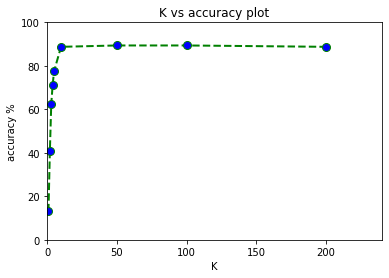

In [313]:
K_list= [1,2,3,4,5,10,50,100,200]
acc_list= []
for K in K_list:
    acc= accuracy_for_K(train_matrix,test_matrix,K,10000000.0)
    acc_list.append(acc)
    print("K= "+str(K)+"   accuracy= "+str(acc))
    print()

#plot K vs accuracy
plt.plot(K_list, acc_list, color='green', linestyle='dashed', linewidth = 2, marker='o', markerfacecolor='blue', markersize= 8) 
  
# setting x and y axis range 
plt.ylim(0,100) 
plt.xlim(0,240) 
   
plt.xlabel('K') 
plt.ylabel('accuracy %')  
plt.title('K vs accuracy plot') 
plt.show() 

# Face recognition with images in detail

In [314]:
def face_recognize(train_matrix,test_matrix,X_test_label,K,threshold_val):
    
    K_eigen_vec= topK_eigenvectors(eigen_vec,K)
    eigen_faces= find_eigenfaces(train_matrix,K_eigen_vec)
    
    training_weight= np.dot(eigen_faces,train_matrix)
    ro,co= training_weight.shape
    
    match,unmatch,not_recognize= 0,0,0
    total= len(test_matrix[0])
    len_plot= (9*total)/4
    fig, ax_list = plt.subplots(2,total,figsize=(len_plot,6))
    #fig, ax_list = plt.subplots(2,total)
    for i in range(total):
        
        test_img= test_matrix[:,i]
        test_plot= np.reshape(test_img, (width,height))
        
        ax_list[0,i].imshow(test_plot,cmap=plt.cm.gray)
        ax_list[0,i].set_title('Test Face \n'+'('+ X_test_label[i]+ ')',fontsize=12,c='b')
        
        test_img= test_matrix[:,i]
        testing_weight= np.dot(eigen_faces,test_img)
        
        diff= np.zeros((ro,co))
        for j in range(len(train_matrix[0])):
            diff[:, j]= training_weight[:, j]- testing_weight
        distance= np.linalg.norm(diff,axis=0)
        #print(dist.shape)
        
        min_dist= distance[0]
        idx =0
        for k in range(len(distance)):
            if min_dist > distance[k]:
                min_dist= distance[k]
                idx= k
        
        if min_dist < threshold_val:
            
            train_img= train_matrix[:,idx]
            train_plot= np.reshape(train_img, (width,height))
            
            if X_test_label[i] == X_train_label[idx]:
                ax_list[1,i].imshow(train_plot,cmap= plt.cm.gray)
                ax_list[1,i].set_title('Matched Face \n'+'('+ X_train_label[idx]+ ')',fontsize=12,c='g')
                match= match+1
            else:
                ax_list[1,i].imshow(train_plot,cmap= plt.cm.gray)
                ax_list[1,i].set_title('Unmatched Face \n'+'('+ X_train_label[idx]+ ')',fontsize=12,c='r')
                unmatch= unmatch+1
        
        else:
            ax_list[1,i].set_title('Not Recognized\n Face', color='y',size=12)
            not_recognize= not_recognize+1

    plt.show()
    total= 1.0*len(test_matrix[0])
    acc= (match/(total))*100
    print("total test faces:      ",total)
    print("faces matched:         ",match)
    print("faces not matched:     ",unmatch)
    print("faces not Recognized : ",not_recognize)
    print("Accuracy:              ",match/total*100)
    
    return acc

# Checking for diff K values

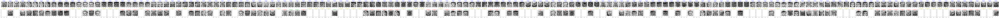

total test faces:       160.0
faces matched:          12
faces not matched:      88
faces not Recognized :  60
Accuracy:               7.5



In [315]:
# Note:  accuracy here is  different from above as threshold value is different

K= 1
acc= face_recognize(train_matrix,test_matrix,X_test_label,K,100000.0)
print()

#NOTE: on execution, 160 test images are printed in row, so they may be small. Clicking on them twice to
#enlarge them (as shown) 

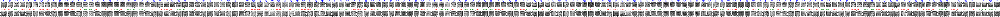

total test faces:       160.0
faces matched:          65
faces not matched:      95
faces not Recognized :  0
Accuracy:               40.625



In [316]:
K= 2
acc= face_recognize(train_matrix,test_matrix,X_test_label,K,10000000.0)
print()


#NOTE: on execution, 160 test images are printed in row, so they may be small. Clicking on them once to
#enlarge them (as shown)

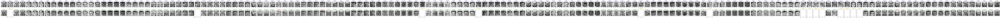

total test faces:       160.0
faces matched:          143
faces not matched:      3
faces not Recognized :  14
Accuracy:               89.375



In [317]:
K= 50
acc= face_recognize(train_matrix,test_matrix,X_test_label,K,10000000.0)
print()


#NOTE: on execution, 160 test images are printed in row, so they may be small. Clicking on them once to
#enlarge them (as shown)

# Checking for imposter images

In [318]:
#imposter images testing

imposter_path= '/home/elitesf/Downloads/face_dataset/imposter'

X_impos= []
X_impos_label= []

for img_label in os.listdir(imposter_path):
    
    img_path= os.path.join(imposter_path,img_label)
    X_impos.append(img_path)
    X_impos_label.append(img_label)
        
print('Imposter images count: ',len(X_impos))

Imposter images count:  10


In [319]:
impos_matrix= images_in_matrixform(X_impos)
print('Imposter matrix dimensions: ',impos_matrix.shape,'\n')
print('Imposter Matrix \n',impos_matrix)

Imposter matrix dimensions:  (4096, 10) 

Imposter Matrix 
 [[136.   4. 255. ...  18.  19.  17.]
 [142.   6. 255. ...  19.  24.  19.]
 [149.   6. 255. ...  20.  28.  20.]
 ...
 [138.  98.   0. ...   0.  15.   5.]
 [133.  86.   0. ...   0.  15.  10.]
 [127.  82.   0. ...   0.  16.  16.]]


In [320]:
impost_matrix= normalize_matrix(impos_matrix)
print('Normalised Imposter matrix dimensions: ',impos_matrix.shape,'\n')
print('Normalised Imposter matrix:\n',impos_matrix,'\n')

4096
Mean img vector:
 [71.3 72.1 72.7 ... 41.8 39.9 41.9] 

Normalised Imposter matrix dimensions:  (4096, 10) 

Normalised Imposter matrix:
 [[ 64.7 -67.3 183.7 ... -53.3 -52.3 -54.3]
 [ 69.9 -66.1 182.9 ... -53.1 -48.1 -53.1]
 [ 76.3 -66.7 182.3 ... -52.7 -44.7 -52.7]
 ...
 [ 96.2  56.2 -41.8 ... -41.8 -26.8 -36.8]
 [ 93.1  46.1 -39.9 ... -39.9 -24.9 -29.9]
 [ 85.1  40.1 -41.9 ... -41.9 -25.9 -25.9]] 



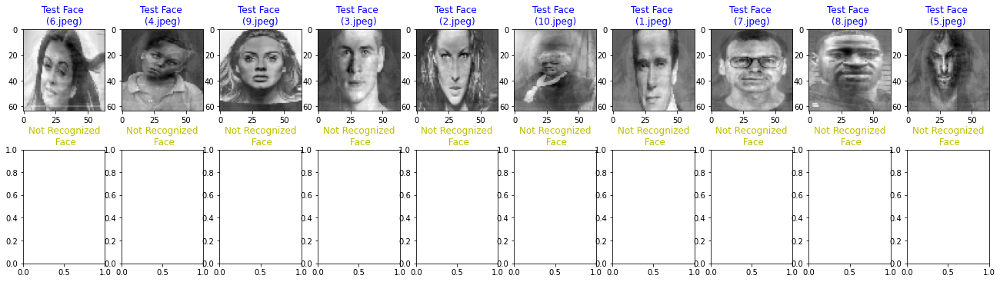

total test faces:       10.0
faces matched:          0
faces not matched:      0
faces not Recognized :  10
Accuracy:               0.0



In [321]:
K= 20
acc= face_recognize(train_matrix,impos_matrix,X_impos_label,K,100000.0)
print()

# Below 10 image are imposters taken randomly from internet and not present in 'actual' dataset 
# but are 'imposter' folder in dataset.

In [322]:
# all imposters not recognized in dataset